In [5]:
# Import Python libraries
import pyfits
import matplotlib.pyplot as plt
from astrodendro import Dendrogram
from astrodendro.analysis import PPStatistic
from astrodendro.analysis import pp_catalog
import astrodendro
from astrodendro.pruning import all_true, min_peak, min_sum, min_npix
import numpy as np
from astropy.io import fits
from astropy import wcs
import aplpy
from astropy import units as u
from astrodendro.scatter import Scatter
import math
import time
import os
import matplotlib as mpl
import pylab as plt
from astropy.wcs.wcs import WCS
from astrodendro.scatter import Scatter
import matplotlib.colors as colors


In [44]:
# Open the fits file that contain the flux map for the region identification
# It could be the Halpha flux map or a sum of the flux map of all emission line
datapath = "/Users/Laurie/Notebook/M33_Mosaic"
hdu_list = fits.open(datapath+"/M33_Mosaic_LineMaps.map.6563.1x1.flux.ext_corr.fits")
data = hdu_list[0].data
wcs = WCS(hdu_list[0].header)


<IPython.core.display.Javascript object>


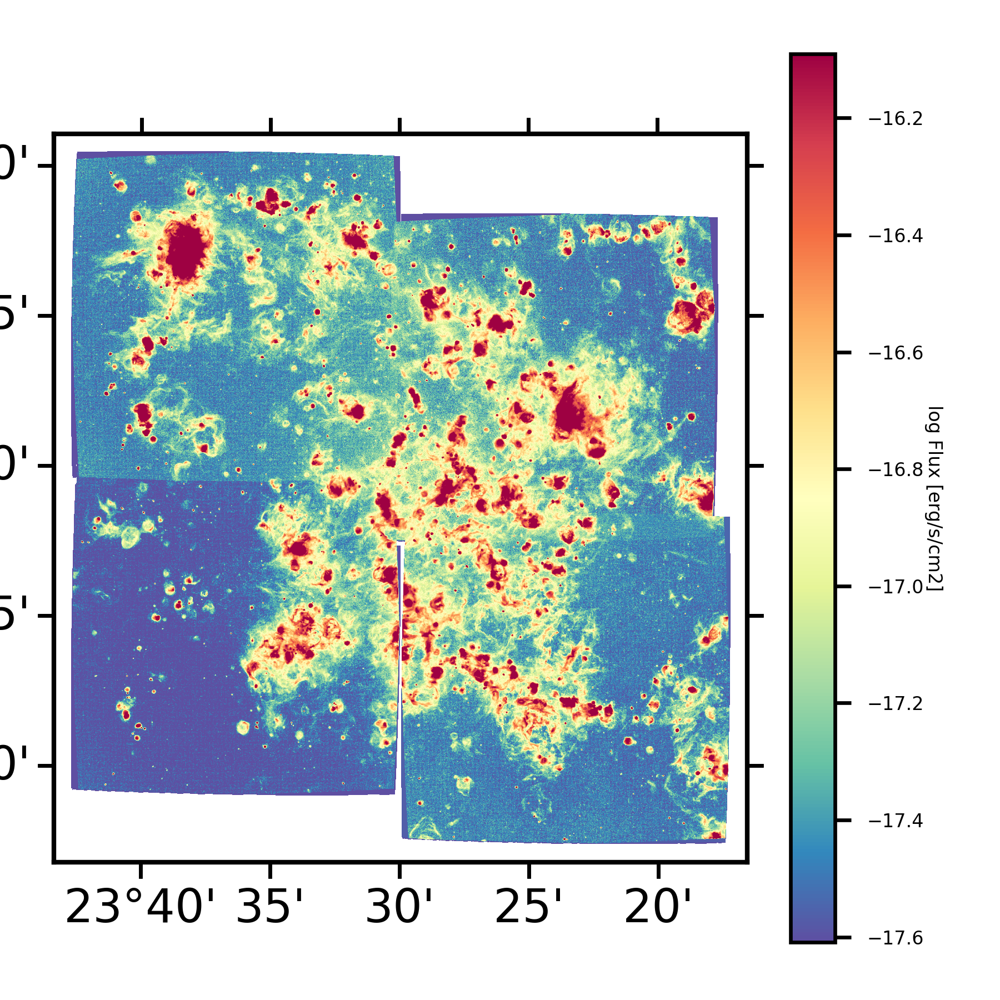

/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log10
  
/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in log10
  


In [13]:
%matplotlib nbagg
# Plot Flux map for visual inspection, Usefull to estimate and fix the dendrogram parameters (delta, minvalue, see next cell)
lsize=4
fig = plt.figure(figsize=(3,3), dpi=300)
ax = fig.add_subplot(1, 1, 1, projection=wcs)
logData = np.log10(data)
image_data = logData
img = plt.imshow(image_data, cmap = "Spectral_r", origin="lower", vmin=np.nanpercentile(image_data, 25), vmax=np.nanpercentile(image_data, 98))
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=lsize)
cbar.set_label('log Flux [erg/s/cm2]', rotation=270, size = lsize)
plt.tight_layout()
plt.show(img)

In [35]:

starttime = time.time()

analyzeLR = 'no'
plotLR = 'noss'

galaxy = 'M33'
binsize = 1
quadrant = 'SE'
#Line code, wavelength, waveband, NebulaBayes name, label name
emlines = [[1,3727,'SN1','OII3726',r'(O II, 3726 $\AA$)'], #OII
           [2,4861,'SN2','Hbeta',r'(H$\beta$, 4861 $\AA$)'], #H-beta
           [3,4959,'SN2','No NB','(O III, 4959 $\AA$)'], #OIII
           [4,5007,'SN2','OIII5007','(O III, 5007 $\AA$)'], #OIII
           [5,6548,'SN3','No NB','(N II, 6548 $\AA$)'], #NII
           [6,6563,'SN3','Halpha',r'(H$\alpha$, 6563 $\AA$)'], #H-alpha
           [7,6583,'SN3','NII6583','(N II, 6583 $\AA$)'], #NII
           [8,6716,'SN3','SII6716','(S II, 6716 $\AA$)'], #SII
           [9,6731,'SN3','SII6731','(S II, 6731 $\AA$)']] #SII
binstring = str(binsize)+'x'+str(binsize)
# Set the parameter for the Astrodendro identification
minpix = 20 # Minimum number of pixels per regions
mindelta = 0.75 # Minimum flux difference between two peak inside a trunc of a branch
minvalue = 0.00000000001 # Background level
emlinecode = 6 
dendroscaler = 1.0e17 # Dummy factor to put the flux value close to 1

In [36]:
# Takes a few minutes 
NBlinelist = []
for i in range(len(emlines)):
    if emlines[i][3] != 'No NB':
        NBlinelist.append(emlines[i])

# Obtain prime flux map values
emlineprime = int(emlines[emlinecode-1][1])
emlinestringprime = str(emlineprime)
SITELLEbandprime = str(emlines[emlinecode-1][2])

datapathprime = datapath+'/M33_Mosaic_LineMaps.map.6563.1x1.flux.ext_corr'

hdulist = fits.open(datapathprime+'.fits')
xlen = hdulist[0].header['NAXIS1']
ylen = hdulist[0].header['NAXIS2']
rawfluxmapprime = hdulist[0].data
fluxmapprime = (dendroscaler)*(np.nan_to_num(rawfluxmapprime))
fluxmapprimewcs = WCS(hdulist[0].header)
hdulist.close()

# Compute Dendrogram
d = Dendrogram.compute(np.log10(fluxmapprime), min_value=minvalue,min_delta=mindelta,min_npix=minpix, wcs=wcs, verbose=True)

leavesregion = d.leaves

HIIregions = []
for i in range(len(leavesregion)):
    HIIregions.append(np.transpose(astrodendro.structure.Structure.indices(d.leaves[i])))

HIIRunravel = []
for i in range(len(HIIregions)):
    for j in range(len(HIIregions[i])):
        HIIRunravel.append(HIIregions[i][j])

/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log10
/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in log10


Generating dendrogram using 3,253,191 of 18,989,217 pixels (17% of data)

[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                               

In [37]:
# Note: M33 is 835 kpc away 
# We have a pixel scale of 0.32'', then one pixel is 1.3 pc at distance of M33

In [38]:
# Assuming that the HII regions are contained in the dendrogram leaves, you can access the information very easily
region = d.leaves
print region

[<Structure type=leaf idx=1>, <Structure type=leaf idx=2>, <Structure type=leaf idx=4>, <Structure type=leaf idx=5>, <Structure type=leaf idx=6>, <Structure type=leaf idx=7>, <Structure type=leaf idx=8>, <Structure type=leaf idx=9>, <Structure type=leaf idx=10>, <Structure type=leaf idx=11>, <Structure type=leaf idx=12>, <Structure type=leaf idx=13>, <Structure type=leaf idx=14>, <Structure type=leaf idx=15>, <Structure type=leaf idx=16>, <Structure type=leaf idx=17>, <Structure type=leaf idx=19>, <Structure type=leaf idx=20>, <Structure type=leaf idx=25>, <Structure type=leaf idx=26>, <Structure type=leaf idx=27>, <Structure type=leaf idx=28>, <Structure type=leaf idx=29>, <Structure type=leaf idx=30>, <Structure type=leaf idx=31>, <Structure type=leaf idx=32>, <Structure type=leaf idx=40>, <Structure type=leaf idx=42>, <Structure type=leaf idx=43>, <Structure type=leaf idx=44>, <Structure type=leaf idx=48>, <Structure type=leaf idx=49>, <Structure type=leaf idx=50>, <Structure type=l

In [39]:
print 'Number of regions detected = ', len(leavesregion)
i=200 # Lets check region ID 200
print 'Regions ID = ', i, 'x,y = ', HIIregions[i] # Print region position
print len(HIIregions[i]) # Print the pixels inside the region

Number of regions detected =  537
Regions ID =  200 x,y =  [[1915 3108]
 [1915 3103]
 [1915 3101]
 ...
 [1917 3080]
 [1906 3106]
 [1896 3113]]
5632


In [40]:
mask = np.zeros(hdu_list[0].data.shape, dtype=bool)
for leaf in d.leaves:
    mask = mask | leaf.get_mask()
mask_hdu = fits.PrimaryHDU(mask.astype('short'), hdu_list[0].header)

mask_tr = np.zeros(hdu_list[0].data.shape, dtype=bool)
for tru in d.trunk:
    mask_tr = mask_tr | tru.get_mask()
mask_hdu_tr = fits.PrimaryHDU(mask_tr.astype('short'), hdu_list[0].header)

<IPython.core.display.Javascript object>


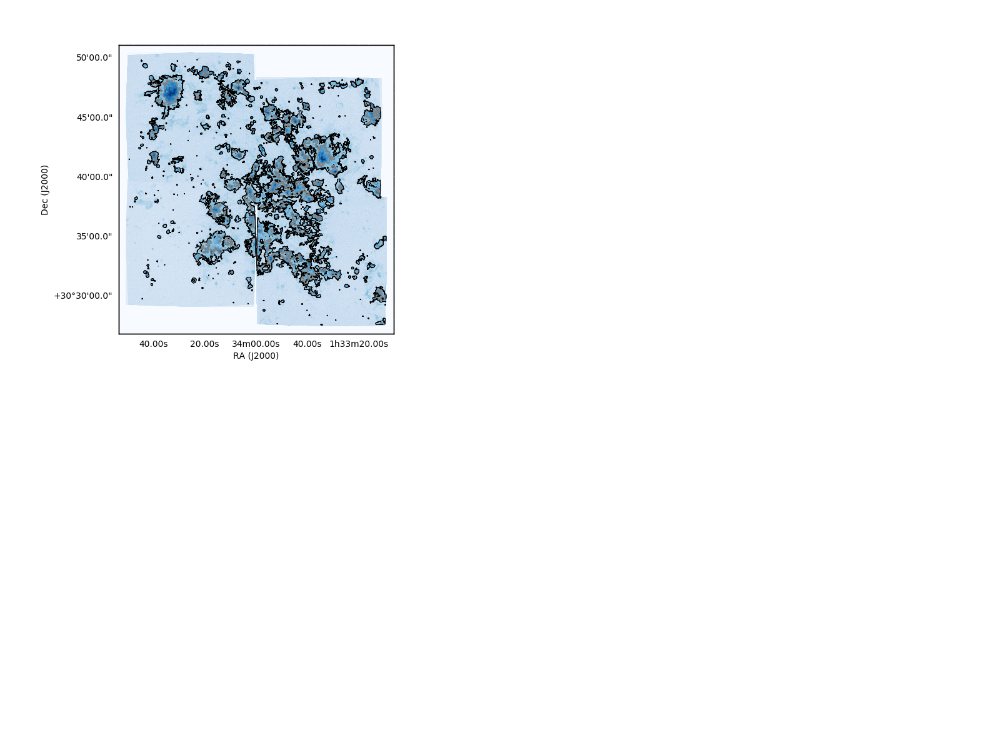

In [41]:
fig = aplpy.FITSFigure(hdu_list[0], figsize=(8, 6))
ax = plt.gca()
fig.show_colorscale(cmap='Blues',vmin=4e-19, vmax=5e-15, vmid=0, stretch='log')
fig.show_contour(mask_hdu, colors='grey', linewidths=0.5)
fig.show_contour(mask_hdu_tr, colors='black', linewidths=0.5)

<IPython.core.display.Javascript object>


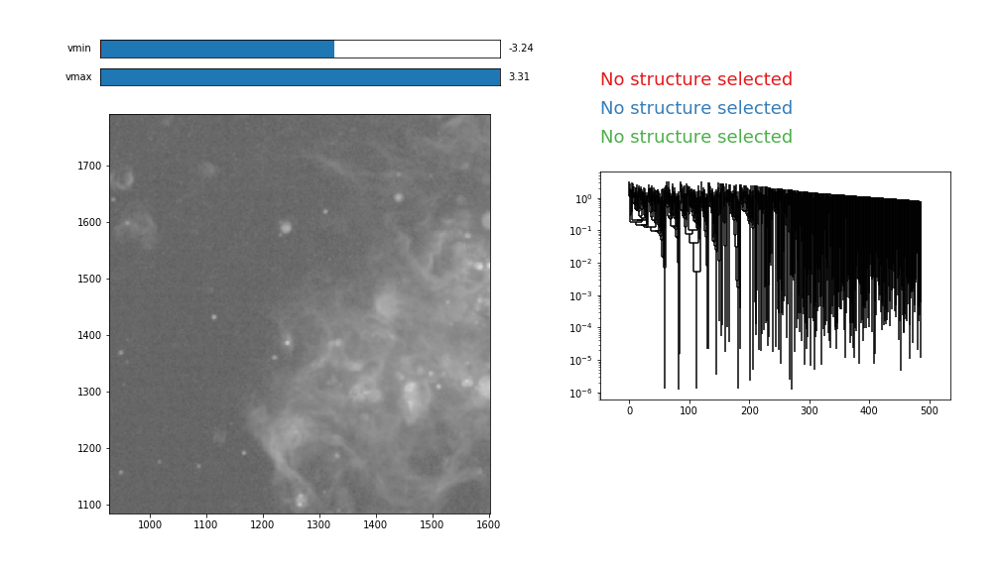

In [101]:
%matplotlib nbagg
dv = d.viewer()
dv.show()
# You can click on the region to see where they are in the tree

In [110]:
### Compute statistics of dendrogram

## Set up Python dictionary with required metaData:
metadata = {}
metadata['data_unit'] = u.Jy#u.erg / (u.cm ** 2 * u.s) ##flux units of the data 
metadata['spatial_scale'] = 0.32 * u.arcsec ##pixel scale
metadata['wavelength'] = 656.3 * u.nm ##wavelength at monochromatic flux
# metadata['wcs'] = WCS ##instance of WCS

In [111]:
cat = pp_catalog(d, metadata)
print cat

Computing catalog for 713 structures

[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 0%
[>                                        ] 1%
[>                                        ] 1%
[>                                        ] 1%
[>                                        ] 1%
[>                                        ] 1%
[>                                        ] 1%
[>                                        ] 1%
[>                                        ] 2%
[>                                        ] 2%
[>                                        ] 2%
[=>                                       ] 2%
[=>                                       ] 2%
[=>                                       ] 2%
[=>                   

In [171]:
#Now to filter the other flux maps.
fluxmapsf = []
filtdatapaths = []
for k in range(len(fluxmaps)):
    fluxmap = fluxmaps[k]
    fluxmapf = np.empty((ylen,xlen,))
    fluxmapf[:] = np.nan
    for i in range(len(dendfilterunravel)):
        fluxmapf[dendfilterunravel[i][0]][dendfilterunravel[i][1]] = fluxmap[dendfilterunravel[i][0]][dendfilterunravel[i][1]]
    
    hdu_fluxmapf = fits.PrimaryHDU(fluxmapf)
    
    emlinestring = str(NBlinelist[k][1])
    SITELLEband = NBlinelist[k][2]
    datapath1 = datapath+'/M33-'+quadrant+'_'+SITELLEband+'.1.0.LineMaps.map.'+emlinestring+'.'+binstring+'.flux.ext_corr'
    
    fluxmapfpath = datapath1+'_dendf.fits'
    
    if os.path.exists(fluxmapfpath) == True: #first, for the velmap
        os.system('rm '+fluxmapfpath)
        hdu_fluxmapf.writeto(fluxmapfpath)
    if os.path.exists(fluxmapfpath) == False:
        hdu_fluxmapf.writeto(fluxmapfpath)
    filtdatapaths.append(fluxmapfpath)

np.savez('run_parameters',galaxy=galaxy,binsize=binsize,binstring=binstring,
         quadrant=quadrant,NBlinelist=NBlinelist,xlen=xlen,ylen=ylen,
         emlinecode=emlinecode,emlines=emlines,emlineprime=emlineprime,
         emlinestringprime=emlinestringprime, SITELLEbandprime=SITELLEbandprime,
         filtdatapaths=filtdatapaths,HIIRunravel=HIIRunravel,
         coordstoremove=coordstoremove,HIIRpixels=HIIRpixels,
         dendfilter=dendfilter,dendfilterunravel=dendfilterunravel)



In [178]:
from numpy import load

data = load(datapath+'/M33_NB_results_mapdata.npz')
lst = data.files
for item in lst:
    print(item)
    print(data[item])

ZmapCI95low
[[ nan  nan  nan ...,  nan  nan  nan]
 [ nan  nan  nan ...,  nan  nan  nan]
 [ nan  nan  nan ...,  nan  nan  nan]
 ..., 
 [ nan  nan  nan ...,  nan  nan  nan]
 [ nan  nan  nan ...,  nan  nan  nan]
 [ nan  nan  nan ...,  nan  nan  nan]]
Pk_CI68low_array
[list([6.1684211178829802])
 list([6.8631580503363363, 4.5473682754918148, 6.5157895841096583, 7.2105265165630144, 7.0947370278207877, 7.0947370278207877, 5.0105262304607194, 4.6631577642340414, 4.6631577642340414, 6.978947539078562, 7.2105265165630144, 4.7789472529762671, 4.6631577642340414, 4.5473682754918148, 7.2105265165630144])
 list([4.6631577642340414, 4.8947367417184928, 4.5473682754918148, 4.5473682754918148, 4.5473682754918148, 4.6631577642340414, 4.7789472529762671, 4.6631577642340414, 4.6631577642340414, 5.1263157192029452, 4.6631577642340414, 4.8947367417184928, 4.6631577642340414, 4.5473682754918148, 4.6631577642340414, 4.5473682754918148, 4.8947367417184928, 4.5473682754918148, 4.7789472529762671, 4.66315776423

In [179]:
print lst

['ZmapCI95low', 'Pk_CI68low_array', 'UmapCI68high', 'U_CI95high_array', 'Pkmap', 'UmapCI95high', 'Z_CI95high_array', 'Z_array', 'PkmapCI95high', 'Z_CI68low_array', 'Pk_array', 'U_CI68high_array', 'ZmapCI68high', 'Pk_CI95high_array', 'UmapCI68low', 'PkmapCI68high', 'U_CI68low_array', 'PkmapCI95low', 'Z_CI68high_array', 'Pk_CI68high_array', 'Z_CI95low_array', 'Pk_CI95low_array', 'U_CI95low_array', 'UmapCI95low', 'PkmapCI68low', 'Zmap', 'ZmapCI68low', 'Umap', 'ZmapCI95high', 'U_array']


In [192]:
z = data['Z_array']

In [193]:
u = data['U_array']

In [194]:
pk = data['Pk_array']